In [30]:
import pandas as pd

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD
import matplotlib.patches as mpatches
import time

# Classifier Libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import collections


# Other Libraries
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from imblearn.pipeline import make_pipeline as imbalanced_make_pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from imblearn.metrics import classification_report_imbalanced
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report
from collections import Counter
from sklearn.model_selection import KFold, StratifiedKFold
import warnings
warnings.filterwarnings("ignore")
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import StandardScaler, RobustScaler,MinMaxScaler
from sklearn.model_selection import GridSearchCV
from imblearn.pipeline import Pipeline
# Our algorithms, by from the easiest to the hardest to intepret.
from xgboost.sklearn import XGBClassifier
import sklearn.feature_selection as fs
from numpy import argmax
from sklearn.datasets import make_classification
from sklearn.metrics import precision_recall_curve
from sklearn.datasets import make_classification

from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot
from sklearn.metrics import auc
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

### Loading the row data

In [2]:
df = pd.read_csv("/Users/sarasaberiyanboroujeni/Documents/Documents/Weclouddata/Fraud Project/creditcard.csv")

In [3]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
# Due to confidentiality issues, V1 to V28 are the principal components results of PCA transmision.
# The only original values are Time,Amount, and class.
# The feature 'Time' is the time differnce between each transaction and the first transaction in the dataset. 
# The feature 'Amount' is the transaction Amount.
# THe label is 'Class'. it takes value 1 in case of fraud, otherwise it is 0.

## Preprosessing 

### EDA

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
Time      284807 non-null float64
V1        284807 non-null float64
V2        284807 non-null float64
V3        284807 non-null float64
V4        284807 non-null float64
V5        284807 non-null float64
V6        284807 non-null float64
V7        284807 non-null float64
V8        284807 non-null float64
V9        284807 non-null float64
V10       284807 non-null float64
V11       284807 non-null float64
V12       284807 non-null float64
V13       284807 non-null float64
V14       284807 non-null float64
V15       284807 non-null float64
V16       284807 non-null float64
V17       284807 non-null float64
V18       284807 non-null float64
V19       284807 non-null float64
V20       284807 non-null float64
V21       284807 non-null float64
V22       284807 non-null float64
V23       284807 non-null float64
V24       284807 non-null float64
V25       284807 non-null float64
V26  

In [6]:
df.shape

(284807, 31)

In [7]:
# There are 284807 observations, 30 features, and one label

#### Dealing with missing values

In [8]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [9]:
# There are no null values, so cleaning is not needed

In [10]:
# Exploring the descriptive statistics of the features

In [11]:
df.describe(include='all')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [12]:
# In a glance, most feutures are skewed since there are a remarkable differnce between their mean and median values.
# and it is obvious there are outliers in the dataset.


In [13]:
# Principal components v1 to v28 assumed to be scaled formerly as it seems to be because before
# performing PCA on data,the date must be sccaled. 
# Time and amount need to be scaled. Since there are outliers Robustscaler is a better way

In [5]:
data=df.copy()

### Scaling Data

In [6]:
r_scaler = RobustScaler()

data['Amount'] = r_scaler.fit_transform(data['Amount'].values.reshape(-1,1))
data['Time'] = r_scaler.fit_transform(data['Time'].values.reshape(-1,1))


data[['Time','Amount']].head(5)

,Time,Amount
0,-0.994983,1.783274
1,-0.994983,-0.269825
2,-0.994972,4.983721
3,-0.994972,1.418291
4,-0.994960,0.670579


In [6]:
df[['Time','Amount']].head(5)

,Time,Amount
0,0.0,149.62
1,0.0,2.69
2,1.0,378.66
3,1.0,123.50
4,2.0,69.99


### Declare the feautures and label

In [7]:
X = data.drop('Class',axis=1)
y= data['Class']



In [70]:
y_count=y.value_counts()
y_count

0    284315
1       492
Name: Class, dtype: int64

In [19]:
# The number of non_fraud transaction are much more than fraud transactions,so the 'Class' is imblanced.

No Frauds 99.83 % of the dataset
Frauds 0.17 % of the dataset


Text(0, 0.5, 'Count of Transactions')

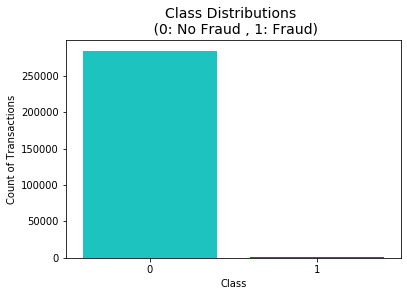

In [62]:
print('No Frauds', round([data['Class'].value_counts(normalize = True)*100][0][0],2), '% of the dataset')
print('Frauds', round([data['Class'].value_counts(normalize = True)*100][0][1],2), '% of the dataset')
colors = ["#01dfd8", "#8e01df"]
sns.countplot(data['Class'], palette=colors);
plt.title('Class Distributions \n (0: No Fraud , 1: Fraud)', fontsize=14);
plt.ylabel('Count of Transactions')


In [21]:
# y.valuecounts(normalize = True)*100
print('ratio_fraud_nontfraud={}%'.format(y_count[1]/y_count[0]*100))


ratio_fraud_nontfraud=0.17304750013189596%


### Dealing wih imblanced data

Text(0, 0.5, 'Count of Transactions')

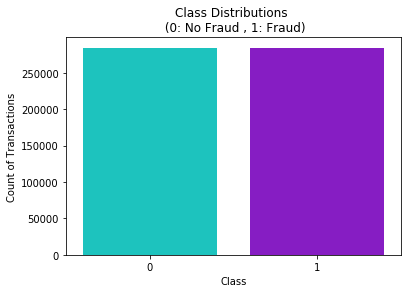

In [8]:
X = data.drop('Class',axis=1)
y= data['Class']

ros = SMOTE(random_state=0)
X_resampled, y_resampled = ros.fit_resample(X, y)

colors = ["#01dfd8", "#8e01df"]
sns.countplot(y_resampled, palette=colors)
plt.title('Class Distributions \n (0: No Fraud , 1: Fraud)', fontsize=12)
plt.ylabel('Count of Transactions')

In [9]:
X_resampled.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,1.783274
1,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.269825
2,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,4.983721
3,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,1.418291
4,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0.670579


In [10]:
data_resampled=X_resampled
data_resampled['Class']=y_resampled
data_resampled.shape

(568630, 31)

In [11]:
data_resampled.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,-0.994983,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,1.783274,0
1,-0.994983,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,-0.269825,0
2,-0.994972,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,4.983721,0
3,-0.994972,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,1.418291,0
4,-0.994960,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,0.670579,0


### Dealing with outliers

In [102]:
# First try

In [103]:
# To deal with outliers,the numerical variables from V1 to V28 and amount are considered 
data_out=data
for i in range(1,30):
    

    q4 = data_out.iloc[:,i].quantile(0.99)
    data_out = data_out[data_out.iloc[:,i]<q4]

    q1=data_out.iloc[:,i].quantile(0.01)
    data_out= data_out[data_out.iloc[:,i]>q1]



In [104]:
data_out.shape

(158976, 31)

In [105]:
data.shape

(284807, 31)

In [ ]:
#This result is not usable.

In [ ]:
# After removing outliers, the number of observations decrease from 284807 to  158976 or almost get down by 45%.
# Because of the high number of feautures, it doesn't maek sense to remove the outliers from the all features 
# and consequently drop the useful data from our dataset. To overcome this problem, the features affect highly the target('Class')
# should be just considerd, in other word the outliers in  highly correleared feautures with target are more 
# likely to distroy the results. The correaltion matrices help us to find these feautures.

In [ ]:
# Because the target is imblanced, the data should be oversampled before plotting the correlation matrices, 
# otherwise the results are not relyable. In fact, in the model, we use the oversampled data and to find which 
# features highly affect the target, we must use the oversampled data for correaltion matrices,too.


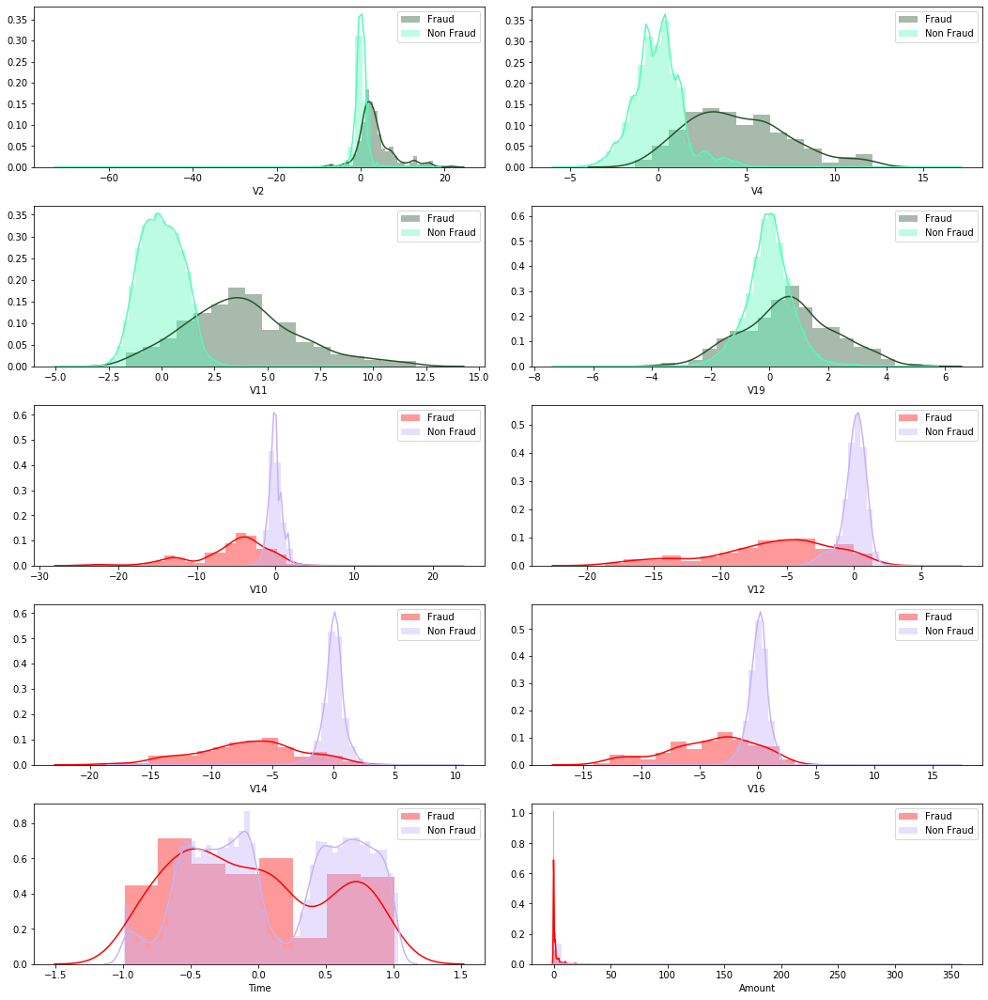

In [67]:
f, ((ax1, ax2),(ax3,ax4),(ax5,ax6),(ax7,ax8),(ax9,ax10)) = plt.subplots(5,2, figsize=(15, 15))

f.tight_layout(pad=2.0)

v2_fraud_dist1 = data['V2'].loc[data['Class'] == 1].values
v2_fraud_dist0 = data['V2'].loc[data['Class'] == 0].values
sns.distplot(v2_fraud_dist1,ax=ax1 ,color='#26532d',label='Fraud')
sns.distplot(v2_fraud_dist0, ax=ax1,color='#56F9BB',label='Non Fraud')
ax1.set_xlabel('V2')
ax1.legend()



v4_fraud_dist1 = data['V4'].loc[data['Class'] == 1].values
v4_fraud_dist0 = data['V4'].loc[data['Class'] == 0].values
sns.distplot(v4_fraud_dist1, ax=ax2 ,color='#26532d',label='Fraud')
sns.distplot(v4_fraud_dist0, ax=ax2,color='#56F9BB',label='Non Fraud')
ax2.set_xlabel('V4')
ax2.legend()



v11_fraud_dist1 = data['V11'].loc[data['Class'] == 1].values
v11_fraud_dist0 = data['V11'].loc[data['Class'] == 0].values
sns.distplot(v11_fraud_dist1, ax=ax3, color='#26532d',label='Fraud')
sns.distplot(v11_fraud_dist0,ax=ax3 ,color='#56F9BB',label='Non Fraud')
ax3.set_xlabel('V11')
ax3.legend()



v19_fraud_dist1 = data['V19'].loc[data['Class'] == 1].values
v19_fraud_dist0 = data['V19'].loc[data['Class'] == 0].values
sns.distplot(v19_fraud_dist1, ax=ax4, color='#26532d',label='Fraud')
sns.distplot(v19_fraud_dist0,ax=ax4, color='#56F9BB',label='Non Fraud')
ax4.set_xlabel('V19')
ax4.legend()

# ---


v10_fraud_dist1 = data['V10'].loc[data['Class'] == 1].values
v10_fraud_dist0 = data['V10'].loc[data['Class'] == 0].values
sns.distplot(v10_fraud_dist1,ax=ax5,color='r',label='Fraud')
sns.distplot(v10_fraud_dist0, ax=ax5, color='#C5B3F9',label='Non Fraud')
ax5.set_xlabel('V10')
ax5.legend()

v12_fraud_dist1 = data['V12'].loc[data['Class'] == 1].values
v12_fraud_dist0 = data['V12'].loc[data['Class'] == 0].values
sns.distplot(v12_fraud_dist1,ax=ax6 ,color='r',label='Fraud')
sns.distplot(v12_fraud_dist0, ax=ax6, color='#C5B3F9',label='Non Fraud')
ax6.set_xlabel('V12')
ax6.legend()

v14_fraud_dist1 = data['V14'].loc[data['Class'] == 1].values
v14_fraud_dist0 = data['V14'].loc[data['Class'] == 0].values
sns.distplot(v14_fraud_dist1,ax=ax7 ,color='r',label='Fraud')
sns.distplot(v14_fraud_dist0, ax=ax7, color='#C5B3F9',label='Non Fraud')
ax7.set_xlabel('V14')
ax7.legend()



v16_fraud_dist1 = data['V16'].loc[data['Class'] == 1].values
v16_fraud_dist0 = data['V16'].loc[data['Class'] == 0].values
sns.distplot(v16_fraud_dist1,ax=ax8,color='r',label='Fraud')
sns.distplot(v16_fraud_dist0, ax=ax8, color='#C5B3F9',label='Non Fraud')
ax8.set_xlabel('V16')
ax8.legend()



v17_fraud_dist1 = data['Time'].loc[data['Class'] == 1].values
v17_fraud_dist0 = data['Time'].loc[data['Class'] == 0].values
sns.distplot(v17_fraud_dist1,ax=ax9, color='r',label='Fraud')
sns.distplot(v17_fraud_dist0, ax=ax9, color='#C5B3F9',label='Non Fraud')
ax9.set_xlabel('Time')
ax9.legend()

             

amount_fraud_dist1 = data['Amount'].loc[data['Class'] == 1].values
amount_fraud_dist0 = data['Amount'].loc[data['Class'] == 0].values
sns.distplot(amount_fraud_dist1,ax=ax10, color='r',label='Fraud')
sns.distplot(amount_fraud_dist0, ax=ax10, color='#C5B3F9',label='Non Fraud')
ax10.set_xlabel('Amount')
ax10.legend()




plt.show()

In [35]:
plt.subplots?

In [ ]:
# sns.set(style="ticks", color_codes=True) # for plot styling
# sns.pairplot(data_resampled, hue='Class');

In [ ]:
# Correleation matrices

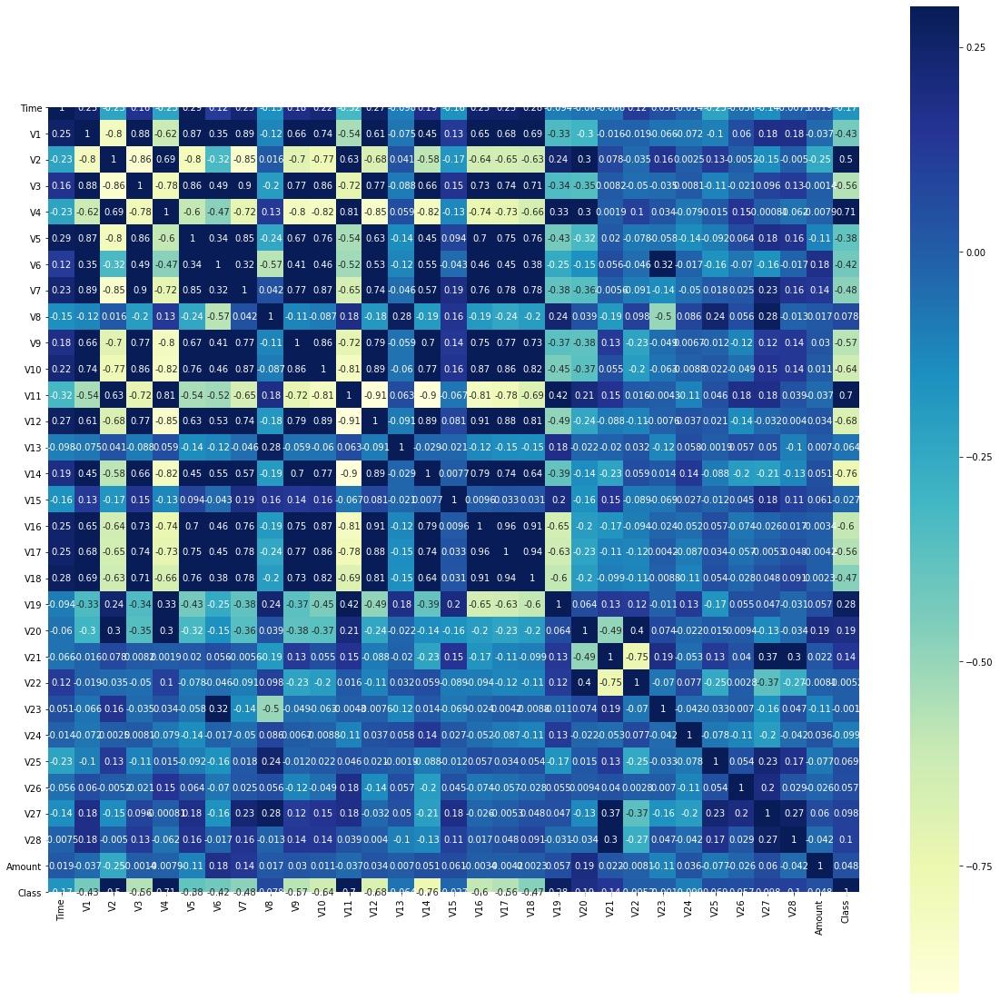

In [66]:
corr = data_resampled.corr()
f, ax = plt.subplots(figsize=(20, 20))
ax = sns.heatmap(corr, cmap="YlGnBu", vmax=.3, square=True,annot=True)

In [ ]:
# Top 4 Positive correlated features:correlation>0.2 -> V11,V4,V2,V19

In [ ]:
#Top 5 Negative Correlated features,correlation<-0.5->V3,V9,V10,V12,V14,V16,V17

In [84]:

# removing outliers for original dataset before oversampling
data_out2=data
for i in [2,4,9,10,11,12,14,16,17,19]:
    

    q4 = data_out2.iloc[:,i].quantile(0.99)
    data_out2= data_out2[data_out2.iloc[:,i]<q4]

    q1=data_out2.iloc[:,i].quantile(0.01)
    data_out2= data_out2[data_out2.iloc[:,i]>q1]




In [109]:
data.shape

(284807, 31)

In [110]:
data_out2.shape

(228298, 31)

In [111]:
data_out=data_resampled
for i in [2,3,4,9,10,11,12,14,16,17,19]:
    

    q4 = data_out.iloc[:,i].quantile(0.99)
    data_out= data_out[data_out.iloc[:,i]<q4]

    q1=data_out.iloc[:,i].quantile(0.01)
    data_out= data_out[data_out.iloc[:,i]>q1]



In [112]:
data_out.shape

(452223, 31)

In [ ]:
# The dataset dimension after removing outliers reduce by almost 20% for the most effective features.

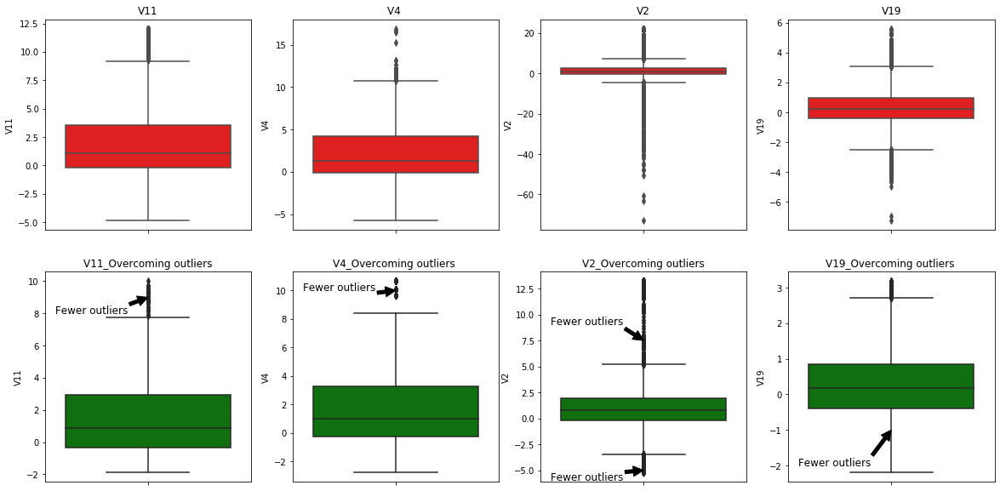

In [113]:
f, axes = plt.subplots(2,4,figsize=(20,10))

sns.boxplot( y=data_resampled['V11'], ax=axes[0,0],color='r')
axes[0,0].set_title('V11')

sns.boxplot(y=data_resampled['V4'], ax=axes[0,1],color='r')
axes[0,1].set_title('V4 ')


sns.boxplot(y=data_resampled['V2'], ax=axes[0,2],color='r')
axes[0,2].set_title('V2')


sns.boxplot(y=data_resampled['V19'],  ax=axes[0,3],color='r')
axes[0,3].set_title('V19')

sns.boxplot(y= data_out['V11'], ax=axes[1,0],color='g')
axes[1,0].set_title('V11_Overcoming outliers')
axes[1,0].annotate('Fewer outliers', xy=(0, 9), xytext=(-0.45, 8),arrowprops=dict(facecolor='black'),
                   fontsize=12)

sns.boxplot(y=data_out['V4'], ax=axes[1,1],color='g')
axes[1,1].set_title('V4_Overcoming outliers ')
axes[1,1].annotate('Fewer outliers', xy=(0, 10), xytext=(-0.45, 10),arrowprops=dict(facecolor='black'),
            fontsize=12)

      
sns.boxplot(y=data_out['V2'], ax=axes[1,2],color='g')
axes[1,2].set_title('V2_Overcoming outliers')
axes[1,2].annotate('Fewer outliers', xy=(0, -5), xytext=(-0.45, -6),arrowprops=dict(facecolor='black'),
            fontsize=12)

axes[1,2].annotate('Fewer outliers', xy=(0, 7.5), xytext=(-0.45, 9),arrowprops=dict(facecolor='black'),
            fontsize=12)




sns.boxplot(y=data_out['V19'],  ax=axes[1,3],color='g')
axes[1,3].set_title('V19_Overcoming outliers ')
axes[1,3].annotate('Fewer outliers', xy=(0, -1), xytext=(-0.45, -2),arrowprops=dict(facecolor='black'),
            fontsize=12)




plt.show()

In [ ]:
# These feauturs have positive correlation. How higher these values are, it is more likly to happen fraud

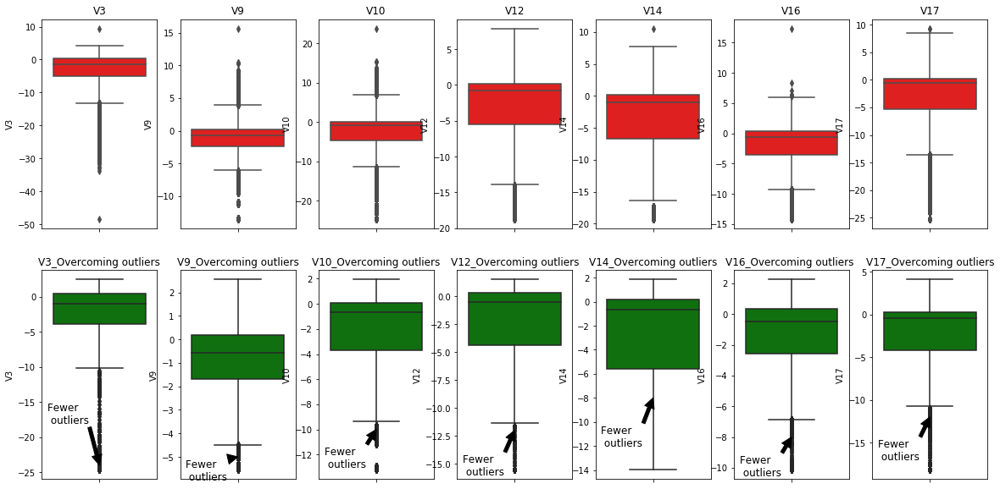

In [114]:
f, axes = plt.subplots(2,7,figsize=(20,10))
                     

sns.boxplot( y=data_resampled['V3'], ax=axes[0,0],color='r')
axes[0,0].set_title('V3')

sns.boxplot(y=data_resampled['V9'], ax=axes[0,1],color='r')
axes[0,1].set_title('V9')


sns.boxplot(y=data_resampled['V10'], ax=axes[0,2],color='r')
axes[0,2].set_title('V10')



sns.boxplot(y=data_resampled['V12'],  ax=axes[0,3],color='r')
axes[0,3].set_title('V12')

sns.boxplot(y=data_resampled['V14'],  ax=axes[0,4],color='r')
axes[0,4].set_title('V14')

sns.boxplot(y=data_resampled['V16'],  ax=axes[0,5],color='r')
axes[0,5].set_title('V16')                      

sns.boxplot(y=data_resampled['V17'],  ax=axes[0,6],color='r')
axes[0,6].set_title('V17')

                       
                       
sns.boxplot(y= data_out['V3'], ax=axes[1,0],color='g')
axes[1,0].set_title('V3_Overcoming outliers')
axes[1,0].annotate('Fewer \n outliers', xy=(0, -24), xytext=(-0.45, -18),arrowprops=dict(facecolor='black'),
                   fontsize=12)

                       
                       
sns.boxplot(y= data_out['V9'], ax=axes[1,1],color='g')
axes[1,1].set_title('V9_Overcoming outliers')
axes[1,1].annotate('Fewer \n outliers', xy=(0, -5), xytext=(-0.45, -6),arrowprops=dict(facecolor='black'),
                   fontsize=12)

                       
                       
sns.boxplot(y= data_out['V10'], ax=axes[1,2],color='g')
axes[1,2].set_title('V10_Overcoming outliers')
axes[1,2].annotate('Fewer \n outliers', xy=(0, -10), xytext=(-0.45, -13),arrowprops=dict(facecolor='black'),
                   fontsize=12)

                       
                       
sns.boxplot(y= data_out['V12'], ax=axes[1,3],color='g')
axes[1,3].set_title('V12_Overcoming outliers')
axes[1,3].annotate('Fewer \n outliers', xy=(0, -12), xytext=(-0.45, -16),arrowprops=dict(facecolor='black'),
                   fontsize=12)
                       
sns.boxplot(y= data_out['V14'], ax=axes[1,4],color='g')
axes[1,4].set_title('V14_Overcoming outliers')
axes[1,4].annotate('Fewer \n outliers', xy=(0, -8), xytext=(-0.45, -12),arrowprops=dict(facecolor='black'),
                   fontsize=12)


sns.boxplot(y=data_out['V16'],  ax=axes[1,5],color='g')
axes[1,5].set_title('V16_Overcoming outliers ')
axes[1,5].annotate('Fewer \n outliers', xy=(0, -8), xytext=(-0.45, -10.5),arrowprops=dict(facecolor='black'),
            fontsize=12)

      
sns.boxplot(y=data_out['V17'], ax=axes[1,6],color='g')
axes[1,6].set_title('V17_Overcoming outliers')
axes[1,6].annotate('Fewer \n outliers', xy=(0, -12), xytext=(-0.45, -17),arrowprops=dict(facecolor='black'),
            fontsize=12)






plt.show()

In [ ]:
# These feautures have the negative correlation. That means how lower the values are, it is more likely 
# to be fraud transaction.


### Feature selection

In [ ]:
# Base Line

In [92]:
X = df.drop('Class',axis=1)
y= df['Class']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=2019)
    
scaler = RobustScaler()

   
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)

smt=SMOTE(random_state=0)
X_train_resampled, y_train_resampled = smt.fit_resample(scaled_X_train, y_train)


rf=RandomForestClassifier(n_estimators=10,max_depth=8,random_state=42)
rf.fit(X_train_resampled, y_train_resampled)

lr = LogisticRegression(random_state=42)
lr.fit(X_train_resampled, y_train_resampled)

print('Logistic Regression: ', lr.score(scaled_X_test, y_test))
print('Random Forest: ', rf.score(scaled_X_test, y_test))
y_pred_rf=rf.predict(scaled_X_test)
y_pred_lr=lr.predict(scaled_X_test)



Logistic Regression:  0.9755905732985029
Random Forest:  0.9963343726299823


In [93]:
print('Logistic Regression Model'classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     71076
           1       0.06      0.94      0.12       126

    accuracy                           0.98     71202
   macro avg       0.53      0.96      0.55     71202
weighted avg       1.00      0.98      0.99     71202
 jhh


### Data Importance

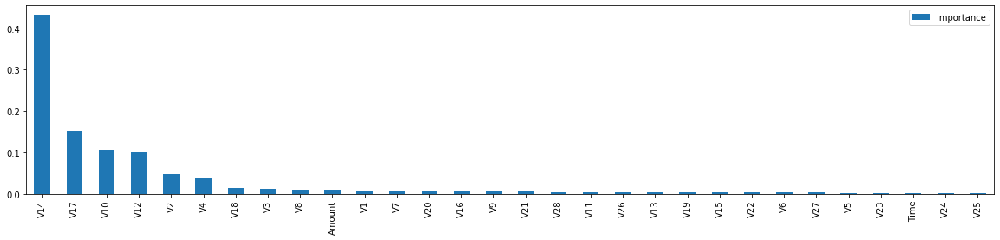

In [117]:
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = X.columns,
                                    columns=['importance']).sort_values('importance',  ascending=False).plot(kind='bar',figsize=(20,4))






In [ ]:
# It seems there is data leakage. The importance of V14 is three times more than other features

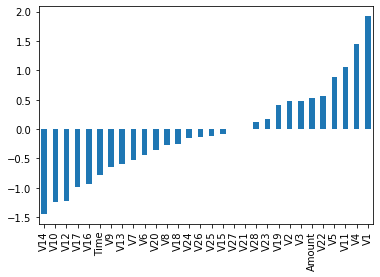

In [118]:
pd.Series(lr.coef_[0], index=X.columns).sort_values().plot(kind='bar');

In [ ]:
### Multicollinearity

In [ ]:
X_resampled

In [119]:
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

In [120]:

def my_cross_val_score(X, y,resample, estimator,parameters, n_splits=5, random_state=42):
    
    ##X and Y are scaled
    

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)




    pipe = Pipeline([
    ('resample', resample),
    ('model', estimator)])

    
    gs = GridSearchCV(pipe, parameters, scoring = 'recall', cv = 5, n_jobs = 5)
    gs.fit(X_train, y_train)
    best_parameters=gs.best_params_
    
    model = gs.best_estimator_
    

    y_pred=model.predict(X_test)

    score=classification_report(y_test, y_pred)


    return print(score)


# Baseline: No Feature Selection 

In [121]:
# Hyper parameter- DecisionTreeClassifier model
X = data.drop('Class',axis=1)
y= data['Class']

estimator=DecisionTreeClassifier(random_state=42)
resample=SMOTE()
parameters = {
    
    'model__max_depth' : range(8,20),
    'model__criterion' : ['gini', 'entropy'],
}
print(my_cross_val_score(X, y,resample, estimator,parameters))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     71074
           1       0.12      0.89      0.21       128

    accuracy                           0.99     71202
   macro avg       0.56      0.94      0.60     71202
weighted avg       1.00      0.99      0.99     71202

None


In [122]:
# defining function considering resampling without tunning 

def model_creator(X, y,resample, estimator, n_splits=5, random_state=42):
    
    ##X and Y are scaled
   

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

    pipe = Pipeline([
    ('resample', resample),
    ('model', estimator)])

    pipe.fit(X_train, y_train)
    

    y_pred=pipe.predict(X_test)

    score=classification_report(y_test, y_pred)
    
    return print(score)




In [123]:
X = data.drop('Class',axis=1)
y= data['Class']



resample=SMOTE()

model_creator(X, y,resample, LogisticRegression(random_state=42))

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     71065
           1       0.05      0.88      0.09       137

    accuracy                           0.97     71202
   macro avg       0.52      0.93      0.54     71202
weighted avg       1.00      0.97      0.98     71202



In [124]:
model_creator(X, y,resample, DecisionTreeClassifier(random_state=42))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71085
           1       0.40      0.82      0.54       117

    accuracy                           1.00     71202
   macro avg       0.70      0.91      0.77     71202
weighted avg       1.00      1.00      1.00     71202



In [ ]:
# The results are not acceptable, lets do feature selection

### Corr with Target - top 

In [126]:
corr_matrix = data.corr()

In [127]:
corr_matrix.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,1.173963e-01,-1.059333e-02,-4.196182e-01,-1.052602e-01,1.730721e-01,-6.301647e-02,8.471437e-02,-3.694943e-02,-8.660434e-03,...,4.473573e-02,1.440591e-01,5.114236e-02,-1.618187e-02,-2.330828e-01,-4.140710e-02,-5.134591e-03,-9.412688e-03,-0.010596,-0.012323
V1,0.117396,1.000000e+00,4.697350e-17,-1.424390e-15,1.755316e-17,6.391162e-17,2.398071e-16,1.991550e-15,-9.490675e-17,2.169581e-16,...,-1.755072e-16,7.477367e-17,9.808705e-16,7.354269e-17,-9.805358e-16,-8.621897e-17,3.208233e-17,9.820892e-16,-0.227709,-0.101347
V2,-0.010593,4.697350e-17,1.000000e+00,2.512175e-16,-1.126388e-16,-2.039868e-16,5.024680e-16,3.966486e-16,-4.413984e-17,-5.728718e-17,...,8.444409e-17,2.500830e-16,1.059562e-16,-8.142354e-18,-4.261894e-17,2.601622e-16,-4.478472e-16,-3.676415e-16,-0.531409,0.091289
V3,-0.419618,-1.424390e-15,2.512175e-16,1.000000e+00,-3.416910e-16,-1.436514e-15,1.431581e-15,2.168574e-15,3.433113e-16,-4.233770e-16,...,-2.971969e-17,4.648259e-16,2.115206e-17,-9.351637e-17,4.771164e-16,6.521501e-16,6.239832e-16,7.726948e-16,-0.210880,-0.192961
V4,-0.105260,1.755316e-17,-1.126388e-16,-3.416910e-16,1.000000e+00,-1.940929e-15,-2.712659e-16,1.556330e-16,5.195643e-16,3.859585e-16,...,-9.976950e-17,2.099922e-16,6.002528e-17,2.229738e-16,5.394585e-16,-6.179751e-16,-6.403423e-17,-5.863664e-17,0.098732,0.133447


In [128]:
corr_by_target = corr_matrix.loc['Class', :]


corr_by_target_tuples = [(i, corr_by_target[i]) for i in list(corr_by_target.index) if i != 'Class']



corr_by_target_tuples = sorted(corr_by_target_tuples, key=lambda tup: tup[1], reverse=True)

selected_corr_10 = [t[0] for t in corr_by_target_tuples[:10]]



In [129]:
selected_corr_10

['V11', 'V4', 'V2', 'V21', 'V19', 'V20', 'V8', 'V27', 'V28', 'Amount']

In [130]:
corr_by_target_tuples[:10]

[('V11', 0.15487564474346413),
 ('V4', 0.1334474862385853),
 ('V2', 0.09128865034433538),
 ('V21', 0.0404133806104527),
 ('V19', 0.03478301303640623),
 ('V20', 0.020090324196912198),
 ('V8', 0.01987512391473314),
 ('V27', 0.017579728189458178),
 ('V28', 0.009536040916206127),
 ('Amount', 0.0056317530067495365)]

In [132]:
selected_corr_10 = [t[0] for t in corr_by_target_tuples[:15]]

model_creator( X[selected_corr_10], y,resample, DecisionTreeClassifier(random_state=42))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71062
           1       0.27      0.76      0.40       140

    accuracy                           1.00     71202
   macro avg       0.64      0.88      0.70     71202
weighted avg       1.00      1.00      1.00     71202



In [ ]:
# by this subdataset the results are not good, lets try the other feature selection method

### VIF

In [134]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

# here we make use of the variance_inflation_factor, which will basically output the respective VIFs 
smt=SMOTE()
X_smt_resampled, y_smt_resampled = smt.fit_resample(X, y)


vif["VIF"] = [variance_inflation_factor(X_smt_resampled.values, i) for i in range(X_smt_resampled.shape[1])]
# Finally, I like to include names so it is easier to explore the result
vif["Features"] = X_smt_resampled.columns

In [135]:
vif=vif.sort_values(by='VIF')
vif

,VIF,Features
26,1.142858,V26
13,1.170272,V13
24,1.184061,V24
15,1.260421,V15
28,1.439916,V28
25,1.494352,V25
27,1.874621,V27
23,2.391735,V23
19,2.414213,V19
0,2.606944,Time


In [136]:

VIF_to_select=vif[vif['VIF']<5]['Features']

VIF_to_select

26     V26
13     V13
24     V24
15     V15
28     V28
25     V25
27     V27
23     V23
19     V19
0     Time
22     V22
20     V20
6       V6
Name: Features, dtype: object

In [137]:
model_creator(X[VIF_to_select], y,resample, DecisionTreeClassifier(random_state=42))

              precision    recall  f1-score   support

           0       1.00      0.99      0.99     71093
           1       0.08      0.57      0.14       109

    accuracy                           0.99     71202
   macro avg       0.54      0.78      0.57     71202
weighted avg       1.00      0.99      0.99     71202



### RFE for oversampled data

In [139]:
# feature extraction
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
smt=SMOTE()
X_train_resampled, y_train_resampled = smt.fit_resample(X_train, y_train)



rfe = fs.RFE(DecisionTreeClassifier(random_state=42), n_features_to_select=15).fit(X_train_resampled,y_train_resampled)


In [140]:
selected_features_rfe = list(X_train_resampled.columns[rfe.get_support()])
#sorted(zip(map(lambda x: round(x, 4), fit.ranking_), list(X_train.columns)))

selected_features_rfe 

['Time',
 'V1',
 'V3',
 'V4',
 'V7',
 'V10',
 'V11',
 'V12',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V23',
 'V25']

In [143]:
resample=SMOTE()
model_creator(X[selected_features_rfe], y,resample, LogisticRegression(random_state=42))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99     71082
           1       0.06      0.93      0.11       120

    accuracy                           0.97     71202
   macro avg       0.53      0.95      0.55     71202
weighted avg       1.00      0.97      0.99     71202



### Inner balancing samplers

In [147]:
def model_creator_innersampler(X, y, estimator, n_splits=5, random_state=42):
    
    ##X and Y are scaled
   

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

    

    estimator.fit(X_train, y_train)
    

    y_pred=estimator.predict(X_test)

    score=classification_report(y_test, y_pred)


    return print(score)





In [148]:
from sklearn.metrics import balanced_accuracy_score

In [149]:
X = data.drop('Class',axis=1)
y= data['Class']



In [150]:
from imblearn.ensemble import BalancedBaggingClassifier
bbc = BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(),
                                sampling_strategy='auto',
                                 replacement=False,
                                 random_state=0)


In [151]:
model_creator_innersampler(X[VIF_to_select], y, estimator=bbc)

              precision    recall  f1-score   support

           0       1.00      0.93      0.96     71080
           1       0.02      0.75      0.03       122

    accuracy                           0.93     71202
   macro avg       0.51      0.84      0.50     71202
weighted avg       1.00      0.93      0.96     71202



In [ ]:
# After trying different ways for balancing target, I have found that without balancing, the results for both fraud 
# no fraud transactions are better. In this case, the balancing methds are not worthwhile.

### RFE,Feature selection for original data without resampling

In [ ]:
# Feature selection without resampling

In [12]:
X = df.drop('Class',axis=1)
y= df['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
rfe = fs.RFE(DecisionTreeClassifier(random_state=42,max_depth=19), n_features_to_select=10).fit(X_train,y_train)


selected_features_rfe = list(X_train.columns[rfe.get_support()])
selected_features_rfe 

['V4', 'V10', 'V12', 'V14', 'V15', 'V17', 'V25', 'V26', 'V27', 'Amount']

In [13]:
X = data.drop('Class',axis=1)
y= data['Class']


X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe ], y, test_size=0.25)
dt=DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)  

y_pred = dt.predict(X_test)
score=print(classification_report(y_test, y_pred))




              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71072
           1       0.76      0.78      0.77       130

    accuracy                           1.00     71202
   macro avg       0.88      0.89      0.88     71202
weighted avg       1.00      1.00      1.00     71202



### VIF for original data

In [15]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()

# here we make use of the variance_inflation_factor, which will basically output the respective VIFs 


vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
# Finally, I like to include names so it is easier to explore the result
vif["Features"] = X.columns

In [16]:
vif=vif.sort_values(by='VIF')

VIF_to_select=vif[vif['VIF']<5]['Features']

VIF_to_select

16     V16
24     V24
28     V28
26     V26
27     V27
13     V13
17     V17
9       V9
18     V18
19     V19
14     V14
12     V12
15     V15
8       V8
21     V21
10     V10
22     V22
23     V23
25     V25
4       V4
11     V11
6       V6
1       V1
3       V3
20     V20
0     Time
7       V7
5       V5
2       V2
Name: Features, dtype: object

In [17]:
X = df.drop('Class',axis=1)
y= df['Class']


X_train, X_test, y_train, y_test = train_test_split(X[VIF_to_select], y, test_size=0.25, random_state=42)
    
scaler = RobustScaler()

   
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)

rf=RandomForestClassifier(random_state=42)
rf.fit(scaled_X_train, y_train)

print('Random Forest: ', rf.score(scaled_X_test, y_test))
y_pred_rf=rf.predict(scaled_X_test)
print(classification_report(y_test, y_pred_rf))






Random Forest:  0.9995786635206876
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71089
           1       0.94      0.79      0.86       113

    accuracy                           1.00     71202
   macro avg       0.97      0.89      0.93     71202
weighted avg       1.00      1.00      1.00     71202



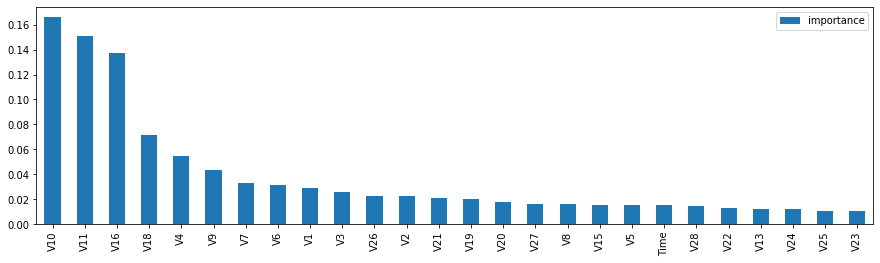

In [164]:
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   index = X[VIF_to_select].drop(['V17','V12','V14'],axis=1).columns,
                                    columns=['importance']).sort_values('importance',  ascending=False).plot(kind='bar',figsize=(15,4))





In [165]:
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25)

In [19]:
X = df.drop('Class',axis=1)
y= df['Class']


X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25, random_state=42)
    
scaler = RobustScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.fit_transform(X_test)

rf=RandomForestClassifier(random_state=42)

rf=rf.fit(scaled_X_train, y_train)


y_train_pred=rf.predict(scaled_X_train)

score_rf_train=print('classification_report_training \n' ,classification_report(y_train, y_train_pred))
y_pred_rf=rf.predict(scaled_X_test)
print('classification_report_test \n',classification_report(y_test, y_pred_rf))






classification_report_training 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    213226
           1       1.00      1.00      1.00       379

    accuracy                           1.00    213605
   macro avg       1.00      1.00      1.00    213605
weighted avg       1.00      1.00      1.00    213605

classification_report_test 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71089
           1       0.92      0.80      0.85       113

    accuracy                           1.00     71202
   macro avg       0.96      0.90      0.93     71202
weighted avg       1.00      1.00      1.00     71202



In [20]:
yhat_rf = rf.predict_proba(scaled_X_test)
rf_probs = yhat_rf[:, 1]

# calculate elements for roc curves
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)
# calcualate roc_auc score
roc_auc_score=roc_auc_score(y_test, rf_probs)
print(' RF roc_auc score: %.3f' % (roc_auc_score))

# elements for precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, rf_probs)
# calculate AUPRC_score
auc_score=auc(recall,precision)
print(' RF AUPRC: %.3f' % (auc_score))






 RF roc_auc score: 0.955
 RF AUPRC: 0.856


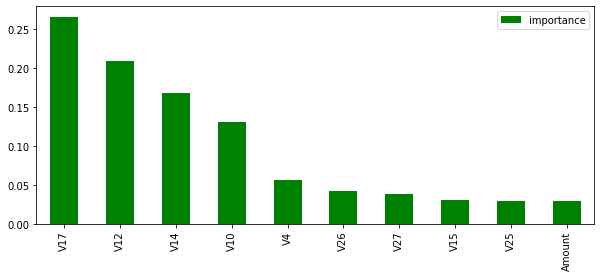

In [22]:
feature_importances = pd.DataFrame(rf.feature_importances_,index = X[selected_features_rfe].columns,
    columns=['importance']).sort_values('importance',  ascending=False). plot(kind='bar',figsize=(10,4),color='g')




### roc curve and Area Under the Receiver Operating Characteristic Curve (ROC AUC) on an imbalanced dataset

In [23]:
# plot no skill and model roc curves
def plot_roc_curve(test_y, model_probs):
    # plot naive skill roc curve
    # plot model roc curve
    fpr, tpr, _ = roc_curve(test_y, model_probs)
    pyplot.plot(fpr, tpr, marker='.', label='{}'.format(model_probs))
    # axis labels
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    # show the legend
    pyplot.legend()
    # show the plot
    pyplot.show()

In [ ]:
GridSearchCV?

In [24]:

X = df.drop('Class',axis=1)
y= df['Class']

# split into train/test sets with same class ratio
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe],y, test_size=0.2, random_state=42)

# --Logistic Regression
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr_pred=lr.predict(X_test)
yhat_lr = lr.predict_proba(X_test)
lr_probs = yhat_lr[:, 1]
fpr_lr, tpr_lr, _ = roc_curve(y_test, lr_probs)
score_lr=print(classification_report(y_test, lr_pred))

# DecisionTreeClassier
dt = DecisionTreeClassifier()
pipe = Pipeline([
     ('scaler' , RobustScaler()),
     ('model', dt)])
parameters_dt= {
    
    'model__max_depth' : range(5,15)}
    
gsdt = GridSearchCV(pipe, parameters_dt, scoring = 'recall', cv = 5, n_jobs = 5)
gsdt.fit(X_train, y_train)
best_param_dt=print(gsdt.best_params_)
model_dt = gsdt.best_estimator_
dt_pred=model_dt.predict(X_test)
yhat_dt = model_dt.predict_proba(X_test)
dt_probs = yhat_dt[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probs)
score_dt=print(classification_report(y_test, dt_pred))


# RandomForestClassifier
rf = RandomForestClassifier()
pipe = Pipeline([
     ('scaler' , RobustScaler()),
     ('model', rf)])

parameters_rf = {
    'model__n_estimators' : [30,50, 60],
    'model__max_depth' : range(8,20)}

gsrf = GridSearchCV(pipe, parameters_rf, scoring = 'recall', cv = 5, n_jobs = 5)
gsrf.fit(X_train, y_train)
print(gsrf.best_params_,'Random Forest Classifier')
model_rf = gsrf.best_estimator_
rf_pred=model_rf.predict(X_test)
yhat_rf = model_rf.predict_proba(X_test)
rf_probs = yhat_rf[:, 1]
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)
score_rf=print(classification_report(y_test, rf_pred))

# --NeuralNetwork
nn = MLPClassifier()
pipe = Pipeline([
     ('scaler' , RobustScaler()),
     ('model', nn)])
parameters_nn = {'model__hidden_layer_sizes': [(10,10,10), (10,10), (5,3),(30,30),(30,50)],
    'model__alpha': [0.0001, 0.05],
     'model__max_iter':np.arange(50,200,50)}

gsnn = GridSearchCV(pipe, parameters_nn, scoring = 'recall', cv = 5, n_jobs = -1)
gsnn.fit(X_train, y_train)
print(gsnn.best_params_,'Neural Network')
model_nn = gsnn.best_estimator_
nn_pred=model_nn.predict(X_test)
yhat_nn = model_nn.predict_proba(X_test)
nn_probs = yhat_nn[:, 1]
fpr_nn, tpr_nn, _ = roc_curve(y_test, nn_probs)
score_nn=print(classification_report(y_test, nn_pred))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.84      0.53      0.65        98

    accuracy                           1.00     56962
   macro avg       0.92      0.77      0.82     56962
weighted avg       1.00      1.00      1.00     56962

{'model__max_depth': 11}
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.91      0.76      0.83        98

    accuracy                           1.00     56962
   macro avg       0.96      0.88      0.91     56962
weighted avg       1.00      1.00      1.00     56962

{'model__max_depth': 13, 'model__n_estimators': 50} Random Forest Classifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.96      0.78      0.86        98

    accuracy                           1.00     56962
   macro avg       0.98   

In [40]:
# --NeuralNetwork
X = df.drop('Class',axis=1)
y= df['Class']
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.2, random_state=42)
   
pipe = Pipeline([
     ('scaler' , RobustScaler()),
     ('model', MLPClassifier())])

parameters_nn ={
     'model__hidden_layer_sizes': [(10,10,10), (10,10), (5,3),(30,30),(30,50)],
     'model__alpha': [0.0001, 0.05],
     'model__max_iter':np.arange(50,200,50)}

gsnn = GridSearchCV(pipe, parameters_nn, scoring = 'recall', cv = 5, n_jobs = -1)
gsnn.fit(X_train, y_train)
print(gsnn.best_params_,'Neural Network')
model_nn = gsnn.best_estimator_
nn_pred=model_nn.predict(X_test)
yhat_nn = model_nn.predict_proba(X_test)
nn_probs = yhat_nn[:, 1]
fpr_nn, tpr_nn, _ = roc_curve(y_test, nn_probs)
score_nn=print(classification_report(y_test, nn_pred))


{'model__alpha': 0.05, 'model__hidden_layer_sizes': (30, 50), 'model__max_iter': 150} Neural Network
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.76      0.81        98

    accuracy                           1.00     56962
   macro avg       0.94      0.88      0.91     56962
weighted avg       1.00      1.00      1.00     56962



In [53]:
X = df.drop('Class', axis=1)
y = df['Class']

(X_train, X_test, y_train, y_test) = \
    train_test_split(X[selected_features_rfe], y, test_size=0.2,
                     random_state=42)

rf = RandomForestClassifier(random_state=42)

pipe = Pipeline([('scaler', RobustScaler()), ('model', rf)])

parameters_rf = {'model__n_estimators': [80],
                 'model__max_depth': range(15)}

gsrf = GridSearchCV(
    pipe,
    parameters_rf,
    scoring=['precision', 'recall'],
    refit='precision',
    cv=5,
    n_jobs=5,
    return_train_score=True,
    )
gsrf.fit(X_train, y_train)
#Finding best estimator
print (gsrf.best_params_, 'Random Forest Classifier')
model_rf = gsrf.best_estimator_


rf_train_pred=model_rf.predict(X_train)
rf_pred = model_rf.predict(X_test)
score_rf_train=print('classification_report_training', classification_report(y_train, rf_train_pred))


score_rf=print('classification_report_test',classification_report(y_test, rf_pred))

yhat_rf = model_rf.predict_proba(X_test)
# keep probabilities for the positive outcome only
rf_probs = yhat_rf[:, 1]

# calculate elements for roc curves
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probs)
# calcualate roc_auc score
roc_auc_score=roc_auc_score(y_test, rf_probs)
print(' RF roc_auc score: %.3f' % (roc_auc_score))

# elements for precision_recall_curve
precision, recall, thresholds = precision_recall_curve(y_test, rf_probs)
# calculate AUPRC_score
auc_score=auc(recall,precision)
print(' RF AUPRC: %.3f' % (auc_score))


{'model__max_depth': 10, 'model__n_estimators': 80} Random Forest Classifier
classification_report_training               precision    recall  f1-score   support

           0       1.00      1.00      1.00    213226
           1       1.00      0.84      0.91       379

    accuracy                           1.00    213605
   macro avg       1.00      0.92      0.96    213605
weighted avg       1.00      1.00      1.00    213605

classification_report_test               precision    recall  f1-score   support

           0       1.00      1.00      1.00     71089
           1       0.95      0.81      0.87       113

    accuracy                           1.00     71202
   macro avg       0.97      0.90      0.94     71202
weighted avg       1.00      1.00      1.00     71202

 RF roc_auc score: 0.975
 RF AUPRC: 0.849


### To check Overfitting

In [55]:
a = pd.DataFrame(gsrf.cv_results_)
a.columns


b = a[['param_model__max_depth', 'param_model__n_estimators','mean_train_recall','mean_train_precision',
   'mean_test_recall', 'mean_test_precision', 'rank_test_recall', 'rank_test_precision']]
b[b['mean_test_recall'].apply(lambda x: x > 0.7)].sort_values('rank_test_precision').head(5)

,param_model__max_depth,param_model__n_estimators,mean_train_recall,mean_train_precision,mean_test_recall,mean_test_precision,rank_test_recall,rank_test_precision
10,10,80,0.838397,1.000000,0.791649,0.941743,4,1
14,14,80,0.868740,1.000000,0.794281,0.939185,1,2
8,8,80,0.831138,0.998422,0.778421,0.938052,7,3
11,11,80,0.846969,1.000000,0.794281,0.936295,1,4
12,12,80,0.855545,1.000000,0.791614,0.936108,5,5


In [ ]:
# Before Hyper-paramter tunning
# Precision: 0.93, Recall: 0.81, F1-score:0.86
# After Hyper-paramter tunning:
# Precision: 0.95, Recall: 0.81, F1-score:0.87

### Boosting

In [51]:
X = df.drop('Class',axis=1)
y= df['Class']

X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.2,random_state=42)

xgb = XGBClassifier(n_estimators=200, reg_alpha=0.5, reg_lambda=0, n_jobs=-1)
pipe = Pipeline([('scaler', RobustScaler()), ('model', xgb)])
pipe.fit(X_train, y_train)  






y_pred_xgb= pipe.predict(X_test)
score=print(classification_report(y_test, y_pred_xgb))

yhat_xgb = pipe.predict_proba(X_test)
# keep probabilities for the positive outcome only
xgb_prob = yhat_xgb[:, 1]
# calculate roc curves
precision, recall, thresholds = precision_recall_curve(y_test, xgb_prob)
auc_score=auc(recall,precision)
print(' XGB AUPRC: %.3f' % (auc_score))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.97      0.77      0.86        98

    accuracy                           1.00     56962
   macro avg       0.99      0.88      0.93     56962
weighted avg       1.00      1.00      1.00     56962

 XGB AUPRC: 0.867


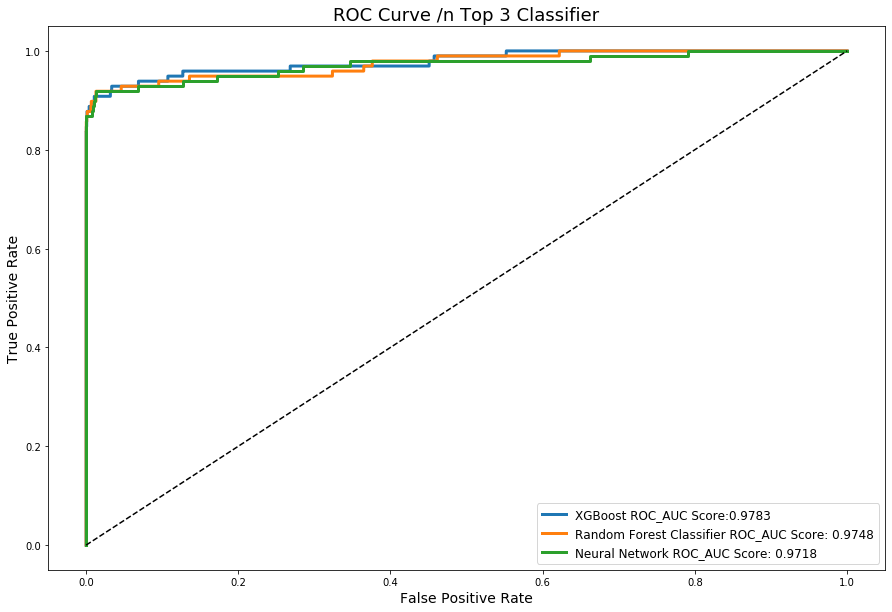

In [41]:
from sklearn.metrics import roc_auc_score
plt.figure(figsize=(15,10))
plt.plot(fpr_xgb,tpr_xgb,label='XGBoost ROC_AUC Score:{:.4f}'.\
                             format(roc_auc_score(y_test, xgb_probs)),linewidth=3)
plt.plot(fpr_rf, tpr_rf, label='Random Forest Classifier ROC_AUC Score: {:.4f}'.\
                             format(roc_auc_score(y_test, rf_probs)),linewidth=3)
plt.plot(fpr_nn, tpr_nn, label='Neural Network ROC_AUC Score: {:.4f}'.\
                             format(roc_auc_score(y_test, nn_probs)),linewidth=3)
plt.plot([0, 1], [0, 1], 'k--')

plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curve /n Top 3 Classifier', fontsize=18)
plt.legend(fontsize=12)    
   

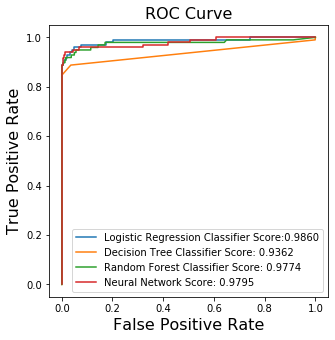

In [16]:
plt.figure(figsize=(5,5))
plt.plot(fpr_lr,tpr_lr,label='Logistic Regression Classifier Score:{:.4f}'.\
                             format(roc_auc_score(y_test, lr_probs)))
# plt.plot(fpr_knn, tpr_knn, label='KNears Neighbors Classifier Score: {:.4f}'.\
#                              format(roc_auc_score(y_test, knn_probs)))
plt.plot(fpr_dt, tpr_dt, label='Decision Tree Classifier Score: {:.4f}'.\
                             format(roc_auc_score(y_test, dt_probs)))
plt.plot(fpr_rf, tpr_rf, label='Random Forest Classifier Score: {:.4f}'.\
                             format(roc_auc_score(y_test, rf_probs)))
plt.plot(fpr_nn, tpr_nn, label='Neural Network Score: {:.4f}'.\
                             format(roc_auc_score(y_test, nn_probs)))
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curve', fontsize=16)
plt.legend()    
   

In [ ]:

precision, recall, thresholds = precision_recall_curve(y_test, lr_probs)
auc_score_lr=auc(recall,precision)
auc_score_lr

In [21]:

precision, recall, thresholds = precision_recall_curve(y_test, nn_probs)
auc_score_nn=auc(recall,precision)
auc_score_nn

0.8578700506738738

In [22]:

precision, recall, thresholds = precision_recall_curve(y_test, dt_probs)
auc_score_dt=auc(recall,precision)
auc_score_dt

0.8468299929229756

In [23]:
precision, recall, thresholds = precision_recall_curve(y_test, rf_probs)
auc_score_rf=auc(recall,precision)
auc_score_rf

0.8671053139882787

### precision-recall curve and Area Under the Precision-Recall Curve (AUPRC)

 

In [152]:
pyplot.scatter?

No handles with labels found to put in legend.


 lr AUPRC: 0.863
Best Threshold=0.500321, F-Score=0.883 ,Recall-Score=0.832 ,Precision-Score=0.940,rf AUPRC: 0.863


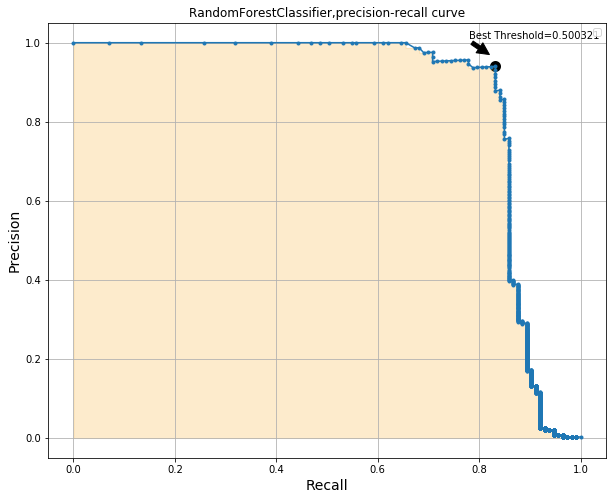

In [184]:
# optimal threshold for precision-recall curve with RandomForestClssifier model

precision, recall, thresholds = precision_recall_curve(y_test, rf_probs)
auc_score=auc(recall,precision)
print(' lr AUPRC: %.3f' % (auc_score))

fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = argmax(fscore)

print('Best Threshold=%f, F-Score=%.3f ,Recall-Score=%.3f ,Precision-Score=%.3f,rf AUPRC: %.3f' % \
            (thresholds[ix], fscore[ix], recall[ix],precision[ix],auc_score))
# plot the roc curve for the model
plt.figure(figsize=(10,8))
pyplot.plot(recall, precision, marker='.')
pyplot.scatter(recall[ix], precision[ix], marker='o', color='black',linewidths=5)
plt.annotate('Best Threshold=%f'%thresholds[ix], xy=(0.82, 0.97), xytext=(0.78, 1.01),\
             arrowprops=dict(facecolor='black'),fontsize=10)


# axis labels
plt.xlabel('Recall',fontsize=14)
plt.ylabel('Precision',fontsize=14)
plt.legend(loc='upper right')
plt.title('RandomForestClassifier,precision-recall curve')
plt.fill_between(recall, precision, step='post', alpha=0.2,
                 color='#F59B00')
plt.grid()
pyplot.show()


 


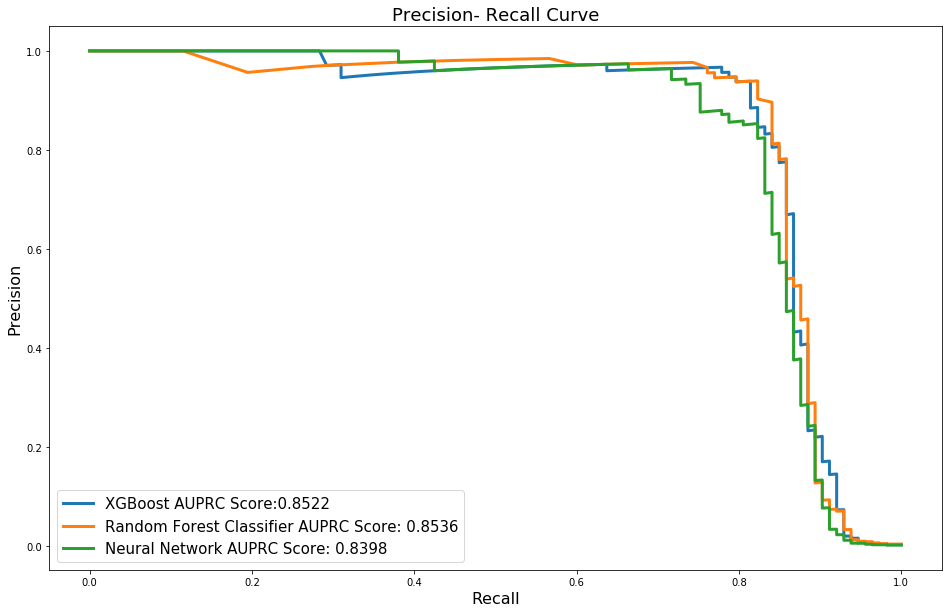

In [49]:
from sklearn.metrics import roc_auc_score
plt.figure(figsize=(16,10))
plt.plot(recall_xgb, precision_xgb,label='XGBoost AUPRC Score:{:.4f}'.\
                             format(auc_score_xgb),linewidth=3)
plt.plot(recall_rf, precision_rf,  label='Random Forest Classifier AUPRC Score: {:.4f}'.\
                             format(auc_score_rf),linewidth=3)
plt.plot(recall_nn, precision_nn,  label='Neural Network AUPRC Score: {:.4f}'.\
                             format(auc_score_nn),linewidth=3)


plt.xlabel('Recall', fontsize=16)
plt.ylabel('Precision', fontsize=16)
plt.title('Precision- Recall Curve', fontsize=18)
plt.legend(fontsize=15)    
   

### Optimal Threshold Tuning

In [43]:
from numpy import arange
from numpy import argmax
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
 
# apply threshold to positive probabilities to create labels
def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')
# split into train/test sets
X_train, X_test, y_train, y_test= train_test_split(X[selected_features_rfe], y, test_size=0.3, random_state=2, stratify=y)
# fit a model
model = LogisticRegression(solver='lbfgs')
model.fit(X_train, y_train)
# predict probabilities
yhat = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = yhat[:, 1]
# define thresholds
thresholds = arange(0, 1, 0.001)
# evaluate each threshold
scores = [f1_score(y_test, to_labels(probs, t)) for t in thresholds]

# get best threshold
ix = argmax(scores)
# print('Best Threshold=%f, F-Score=%.3f ,Recall-Score=%.3f ,Precision-Score=%.3f' % (thresholds[ix], fscore[ix], recall[ix],precision[ix]))

print('Threshold=%.3f, F-Score=%.5f' % (thresholds[ix], scores[ix]))

Threshold=0.125, F-Score=0.80537


Confusion matrix
[[85294     1]
 [   21   127]]
Normalized confusion matrix
[[1.00e+00 1.17e-05]
 [1.42e-01 8.58e-01]]


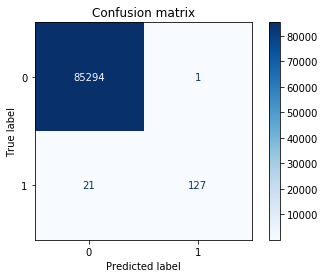

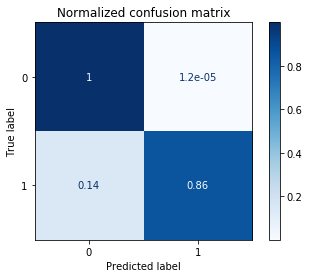

In [44]:

from sklearn.metrics import plot_confusion_matrix

np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix", None),
                  ("Normalized confusion matrix", 'true')]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(model_rf, X_test, y_test,
                                 display_labels=[0,1],
                                 cmap=plt.cm.Blues,
                                 normalize=normalize)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

### Stacking

In [45]:

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB 
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from mlxtend.classifier import StackingClassifier



# Initializing models

X = df.drop('Class',axis=1)
y= df['Class']
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25,random_state=2)



# Initializing models

clf1 = MLPClassifier( hidden_layer_sizes=(70, 70), max_iter=50,random_state=42)
clf2 = RandomForestClassifier(max_depth= 15,n_estimators=80,random_state=42)
clf3 = DecisionTreeClassifier(max_depth= 6,random_state=42)
lr = LogisticRegression(random_state=42)
sclf = StackingClassifier(classifiers=[clf1, clf2, clf3], 
                          meta_classifier=lr)

# params = {'mlpclassifier__hidden_layer_sizes': [(10,10,10), (10,10), (5,3),(20,20),(8,4)],
#           'mlpclassifier__max_iter':np.arange(50,200,50)
#           'randomforestclassifier__n_estimators': [(10, 50)],
#           'randomforestclassifier__max_depth': range(5,15),
#           'meta_classifier__C': [0.1,0.5,3,6, 10.0]}

# grid = GridSearchCV(estimator=sclf, 
#                     param_grid=params, 
#                     cv=5,
#                     refit=True)

pipe = Pipeline([('scaler', RobustScaler()), ('model', sclf)])
pipe.fit(X_train, y_train)

y_pred_st=pipe.predict(X_test)
yhat_st = pipe.predict_proba(X_test)
# keep probabilities for the positive outcome only
st_probs= yhat_st[:, 1]
# calculate roc curves
precision, recall, thresholds = precision_recall_curve(y_test, st_probs)
auc_score=auc(recall,precision)
fpr_st, tpr_st, _ = roc_curve(y_test, st_probs)
print(' StackGridSearch AUPRC: %.3f' % (auc_score))


print(classification_report(y_test, y_pred_st))




 StackGridSearch AUPRC: 0.872
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71095
           1       0.91      0.81      0.86       107

    accuracy                           1.00     71202
   macro avg       0.95      0.91      0.93     71202
weighted avg       1.00      1.00      1.00     71202



In [46]:
roc_auc=roc_auc_score(y_test, st_probs)
print(' StackGridSearch AUPRC: %.3f' % (roc_auc))

 StackGridSearch AUPRC: 0.911


Best Threshold=0.692230, F-Score=0.857 ,Recall-Score=0.813 ,Precision-Score=0.906,StackGridSearch AUPRC: 0.872


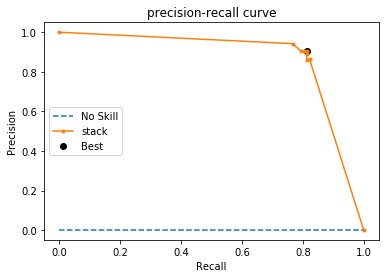

In [47]:
fscore = (2 * precision * recall) / (precision + recall)
# locate the index of the largest f score
ix = argmax(fscore)

print('Best Threshold=%f, F-Score=%.3f ,Recall-Score=%.3f ,Precision-Score=%.3f,StackGridSearch AUPRC: %.3f' % \
                   (thresholds[ix], fscore[ix], recall[ix],precision[ix],auc_score))
# plot the roc curve for the model


no_skill = len(y_test[y_test==1]) / len(y_test)
pyplot.plot([0,1], [no_skill,no_skill], linestyle='--', label='No Skill')
pyplot.plot(recall, precision, marker='.', label='stack')
pyplot.scatter(recall[ix], precision[ix], marker='o', color='black', label='Best')
# axis labels
pyplot.xlabel('Recall')
pyplot.ylabel('Precision')
pyplot.legend()
plt.title('precision-recall curve')
# show the plot
pyplot.show()

### Interpretation

In [ ]:
# pip install shap

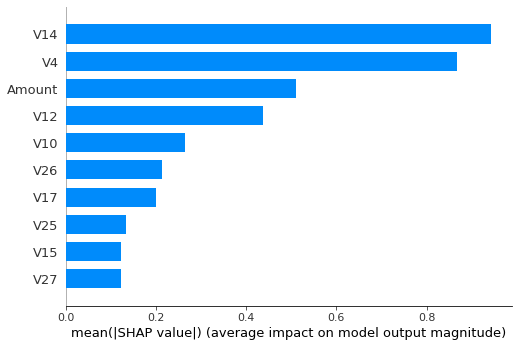

Weight,Feature
0.0006 ± 0.0001,V14
0.0002 ± 0.0000,V17
0.0001 ± 0.0000,V10
0.0001 ± 0.0000,V27
0.0001 ± 0.0000,V26
0.0001 ± 0.0001,V12
0.0000 ± 0.0001,Amount
0.0000 ± 0.0001,V4
0.0000 ± 0.0000,V25
-0.0000 ± 0.0000,V15


In [53]:
import sklearn
import shap
from sklearn.model_selection import train_test_split
import shap 
# print the JS visualization code to the notebook
shap.initjs()

# train a SVM classifier

X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25,random_state=1)

xgb = XGBClassifier(n_estimators=200, reg_alpha=1, reg_lambda=0, n_jobs=-1)

xgb.fit(X_train, y_train) 
xgb.predict(X_test)


shap_values = shap.TreeExplainer(xgb).shap_values(X_test)
shap.summary_plot(shap_values, X_test, plot_type="bar")

import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(xgb, random_state=1).fit(X_test, y_test)

eli5.show_weights(perm, feature_names=X_test.columns.tolist())


In [ ]:
#  Permutation Importance XGB

In [55]:
import eli5
from eli5.sklearn import PermutationImportance


X = df.drop('Class',axis=1)
y= df['Class']
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25,random_state=42)

rf = RandomForestClassifier(max_depth= 15, n_estimators= 80,random_state=42)
pipe = Pipeline([('scaler', RobustScaler()), ('model', rf)])
pipe.fit(X_train, y_train)  

perm = PermutationImportance(pipe, random_state=42).fit(X_test, y_test)

eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.0005 ± 0.0000,V14
0.0001 ± 0.0000,V27
0.0001 ± 0.0000,V17
0.0001 ± 0.0000,V10
0.0001 ± 0.0000,V26
0.0001 ± 0.0000,V4
0.0000 ± 0.0000,Amount
0.0000 ± 0.0000,V12
0.0000 ± 0.0000,V15
0.0000 ± 0.0000,V25


In [56]:
#  Permutation Importance Neuralnetwork

In [57]:
from sklearn.neural_network import MLPClassifier

In [58]:

X = data.drop('Class',axis=1)
y= data['Class']
X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25)


nn = MLPClassifier(solver='lbfgs', max_iter=30, hidden_layer_sizes= (70, 70),random_state=42)
nn.fit(X_train, y_train)
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(nn, random_state=1).fit(X_test, y_test)

eli5.show_weights(perm, feature_names=X_test.columns.tolist())




Weight,Feature
0.0011 ± 0.0000,V14
0.0006 ± 0.0001,V10
0.0002 ± 0.0000,V17
0.0001 ± 0.0000,V4
0.0001 ± 0.0000,Amount
0.0000 ± 0.0000,V12
0.0000 ± 0.0000,V27
0.0000 ± 0.0000,V25
-0.0000 ± 0.0000,V15
-0.0000 ± 0.0000,V26


### Lime

In [59]:
X = data.drop('Class',axis=1)
y= data['Class']

X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25,random_state=42)


from sklearn.neural_network import MLPClassifier
nn = MLPClassifier(solver='lbfgs', alpha=1e-1, hidden_layer_sizes=(40, 40), random_state=42)
nn.fit(X_train, y_train)




MLPClassifier(alpha=0.1, hidden_layer_sizes=(40, 40), random_state=42,
              solver='lbfgs')

In [76]:
X_test_copy=X_test.copy()
X_test_copy['y_proba']=nn.predict_proba(X_test_copy)[:,1]
X_test_copy['predict']=nn.predict(X_test)
X_test_copy['Fraud']=y_test
pd.options.display.max_rows=1000
X_test_copy.sort_values(by='y_proba',ascending=True).head(500)
X_test_copy_reindex=X_test_copy.reset_index(drop=True)
X_test_copy_reindex[X_test_copy_reindex['Fraud']==1].head()




,V4,V10,V12,V14,V15,V17,V25,V26,V27,Amount,y_proba,predict,Fraud
0,9.505594,-14.110184,-10.834006,-9.373859,0.360806,-19.236292,-1.413700,-0.462762,-2.018575,4.781527,0.999980,1,1
565,0.089791,-2.998926,-3.677717,-4.629481,1.942182,-4.605686,-1.279094,-1.123534,-0.630977,4.042199,0.918416,1,1
3025,2.502005,-5.112971,-4.102127,-4.350434,0.000716,-8.078010,-0.191731,0.080999,1.215152,7.977363,0.966087,1,1
3228,0.163310,-1.134454,0.979675,0.984993,-0.382471,-0.052419,-0.071622,-1.125881,-0.170947,15.021170,0.000100,0,1
4178,2.737229,1.987862,-0.863431,-1.016916,-1.559410,-2.043858,0.151643,-0.332115,-0.469800,11.282191,0.000777,0,1


In [61]:
from lime.lime_tabular import LimeTabularExplainer
explainer=LimeTabularExplainer(X_train.values,feature_names=X_train.columns.values,class_names=['No Fraud','Fraud'])



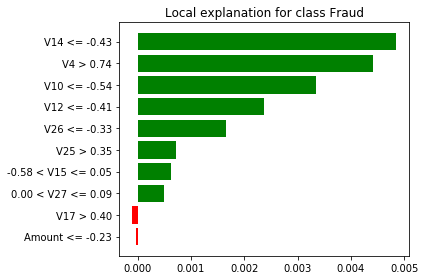

In [62]:
from lime.lime_tabular import LimeTabularExplainer
explainer=LimeTabularExplainer(X_train.values,feature_names=X_train.columns.values,class_names=['No Fraud','Fraud'])


row_show=13509
exp=explainer.explain_instance(X_test.iloc[row_show],nn.predict_proba)

exp.show_in_notebook()

exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()


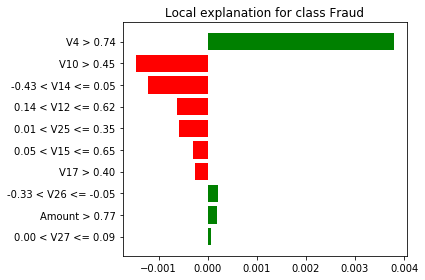

In [63]:
row_show=14770
exp=explainer.explain_instance(X_test.iloc[row_show],nn.predict_proba)

exp.show_in_notebook()

exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()



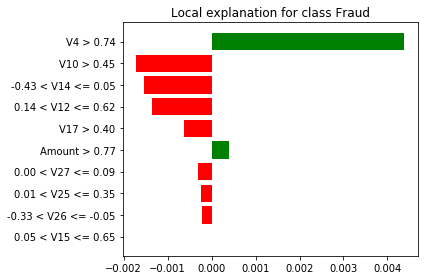

In [64]:
row_show=14770
exp=explainer.explain_instance(X_test.iloc[row_show],nn.predict_proba)

exp.show_in_notebook()

exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()



In [65]:
y_pred = nn.predict(X_test)
score=print(classification_report(y_test, y_pred))



              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71089
           1       0.90      0.76      0.82       113

    accuracy                           1.00     71202
   macro avg       0.95      0.88      0.91     71202
weighted avg       1.00      1.00      1.00     71202



In [66]:
# Lime with RandomForest

In [75]:

X_train, X_test, y_train, y_test = train_test_split(X[selected_features_rfe], y, test_size=0.25,random_state=42)


rf =RandomForestClassifier(max_depth= 15, n_estimators= 80,random_state=42)
rf.fit(X_train, y_train)



X_test_copy=X_test.copy()
X_test_copy['y_proba']=rf.predict_proba(X_test_copy)[:,1]
X_test_copy['predict']=rf.predict(X_test)
X_test_copy['Fraud']=y_test
X_test_copy.sort_values(by='y_proba',ascending=True).head(500)


X_test_copy_reindex=X_test_copy.reset_index(drop=True)
X_test_copy_reindex[X_test_copy_reindex['Fraud']==1].head()





,V4,V10,V12,V14,V15,V17,V25,V26,V27,Amount,y_proba,predict,Fraud
0,9.505594,-14.110184,-10.834006,-9.373859,0.360806,-19.236292,-1.413700,-0.462762,-2.018575,4.781527,0.975000,1,1
565,0.089791,-2.998926,-3.677717,-4.629481,1.942182,-4.605686,-1.279094,-1.123534,-0.630977,4.042199,0.875000,1,1
3025,2.502005,-5.112971,-4.102127,-4.350434,0.000716,-8.078010,-0.191731,0.080999,1.215152,7.977363,0.900000,1,1
3228,0.163310,-1.134454,0.979675,0.984993,-0.382471,-0.052419,-0.071622,-1.125881,-0.170947,15.021170,0.000046,0,1
4178,2.737229,1.987862,-0.863431,-1.016916,-1.559410,-2.043858,0.151643,-0.332115,-0.469800,11.282191,0.004078,0,1


In [68]:
y_pred = rf.predict(X_test)
score=print(classification_report(y_test, y_pred))




              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71089
           1       0.92      0.81      0.86       113

    accuracy                           1.00     71202
   macro avg       0.96      0.90      0.93     71202
weighted avg       1.00      1.00      1.00     71202



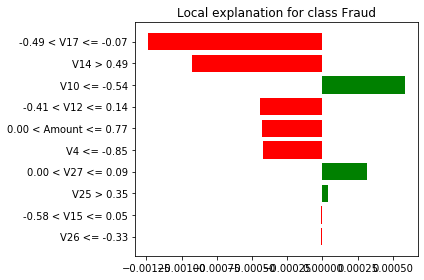

In [69]:
from lime.lime_tabular import LimeTabularExplainer
explainer=LimeTabularExplainer(X_train.values,feature_names=X_train.columns.values,class_names=['No Fraud','Fraud'])

row_show=14885
exp=explainer.explain_instance(X_test.iloc[row_show],rf.predict_proba)

exp.show_in_notebook()
exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()


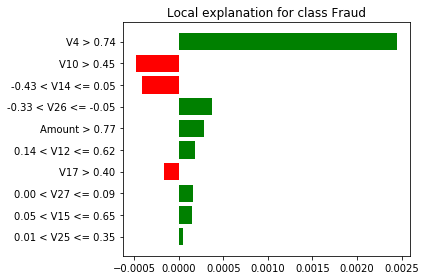

In [70]:
from lime.lime_tabular import LimeTabularExplainer
explainer=LimeTabularExplainer(X_train.values,feature_names=X_train.columns.values,class_names=['No Fraud','Fraud'])



row_show=14770
exp=explainer.explain_instance(X_test.iloc[row_show],rf.predict_proba)

exp.show_in_notebook()



exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()



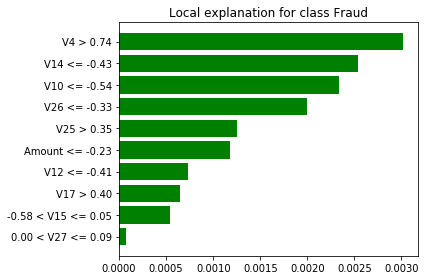

In [71]:
row_show=13509
exp=explainer.explain_instance(X_test.iloc[row_show],rf.predict_proba)

exp.show_in_notebook()



exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()




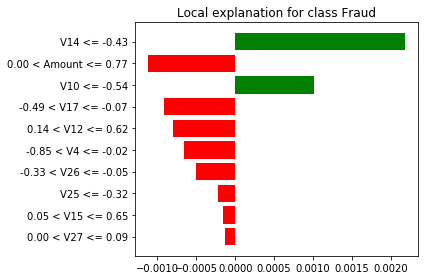

In [72]:
row_show=345
exp=explainer.explain_instance(X_test.iloc[row_show],rf.predict_proba)

exp.show_in_notebook()



exp.as_pyplot_figure()
from matplotlib import pyplot as plt
plt.tight_layout()




In [73]:
# which feature changes will have most impact on the prediction.